In [2]:
%matplotlib inline
import numpy as np
from scipy.integrate import quadrature
from numpy.polynomial import Polynomial
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display

In [3]:
# dg1 here is same as dg2 but with animation 
def dg1(n, porder, T, dt):
    h  = 1.0 / n
    nsteps = int(round(T / dt))
    
    p = porder+1
    # creating lambda function to return S(i) 
    S = lambda x: (h/porder)*x
    Mel = np.zeros((p,p))
    Kel = np.zeros((p,p))
    # C and V in notes, C is coeff. mat, V is S value mat
    C = np.zeros((p,p))
    V = np.zeros((p,p))
    
    #creating the V matrix
    V[:,0] = 1.0
    for i in range(0,p):
        for j in range(1,p):
            V[i,j] =  (S(i))**j
    
    #getting the C matrix
    C = np.linalg.inv(V) 
    
    for i in range(0,p):
        for j in range(0,p):
            Mel[i,j] = quadrature(phi(C[:,i])   * phi(C[:,j]) , 0, h)[0]
            Kel[i,j] = quadrature(d_phi(C[:,i]) * phi(C[:,j]) , 0, h)[0]
    x = np.zeros((p,n))
    
    for i in range(0,p):
        x[i,:] = np.linspace((h/porder)*i, 1-(h-i*(h/porder)), n)
    
    u = np.exp(-(x - 0.5)**2 / 0.1**2)
    
    #calling rk solver to get updated u
    u0 = u.copy()
    unew = rk(u, Kel, Mel, dt, n, nsteps)
    
    fig = plt.figure()
    ax = plt.axes(xlim=(0, 1), ylim=(-.1, 1.1))
    ax.plot(x, u, 'r', lw=2)
    plt.grid(True)
    plot_lines = ax.plot(x, u, 'b', lw=2)

    animation_args = (fig, animate)
    animation_kwargs = {
        'frames': nsteps + 1,
        'interval': 20,
        'blit': True,
        'fargs': [u, plot_lines, Kel, Mel, dt, n],
    }
    
    return animation_args, animation_kwargs

In [4]:
# this function returns polynomial from coeff. matrix
def phi(C):
    #reverse the order of an array
    C1 = C[::-1]
    
    return np.poly1d(C1)

In [5]:
# this function returns the defrenciation of a polynomial
def d_phi(C):
    C1 = C[::-1]
    
    return np.poly1d(np.polyder(C1))

In [6]:
def rk(u, Kel, Mel, dt, n, nsteps):
    u_orig = u
    u0 = u.copy()
    for i in range(0,nsteps):
        for irk in range(4,0,-1):
            r = np.dot(Kel, u)
            r[-1] -= u[-1]
            r[0] += u[-1, np.hstack([n-1, np.arange(n-1)])]
            u = u0 + dt/irk * (np.linalg.solve(Mel, r))
        u0 = u.copy()
        u_orig[:] = u  # Update the original data.
    return u

## a.

In [7]:
def dg2(n, porder, T, dt):
    h  = 1.0 / n
    nsteps = int(round(T / dt))
    
    p = porder+1
    # creating lambda function to return S(i) 
    S = lambda x: (h/porder)*x
    Mel = np.zeros((p,p))
    Kel = np.zeros((p,p))
    # C and V in notes, C is coeff. mat, V is S value mat
    C = np.zeros((p,p))
    V = np.zeros((p,p))
    
    #creating the V matrix
    V[:,0] = 1.0
    for i in range(0,p):
        for j in range(1,p):
            V[i,j] =  (S(i))**j
    
    #getting the C matrix
    C = np.linalg.inv(V) 
    
    for i in range(0,p):
        for j in range(0,p):
            Mel[i,j] = quadrature(phi(C[:,i])   * phi(C[:,j]) , 0, h)[0]
            Kel[i,j] = quadrature(d_phi(C[:,i]) * phi(C[:,j]) , 0, h)[0]
    x = np.zeros((p,n))
    
    for i in range(0,p):
        x[i,:] = np.linspace((h/porder)*i, 1-(h-i*(h/porder)), n)
    
    u = np.exp(-(x - 0.5)**2 / 0.1**2)
    
    #calling rk solver to get updated u
    u0 = u.copy()
    unew = rk(u, Kel, Mel, dt, n, nsteps)
    
    return u0,unew

In [8]:
def animate(frame_number, u, plot_lines, Kel, Mel, dt, n):
    u_orig = u
    u0 = u
    for irk in range(4,0,-1):
        r = np.dot(Kel, u)
        r[0] += np.roll(u[-1,:],1) #shift whole row to right by one   #u[-1, np.hstack([n-1, np.arange(n-1)])]
        r[-1] -= u[-1]
        u = u0 + dt/irk * (np.linalg.solve(Mel, r))
    for index, line in enumerate(plot_lines):
        line.set_ydata(u[:, index])
    u_orig[:] = u  # Update the original data.
    return plot_lines


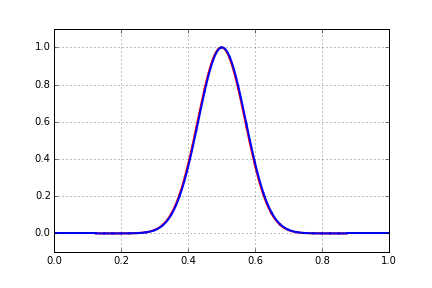
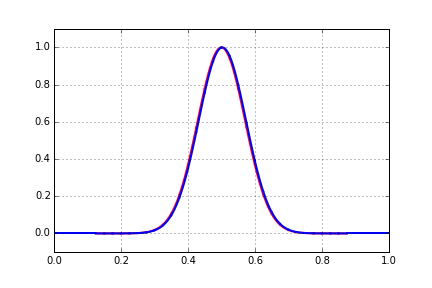
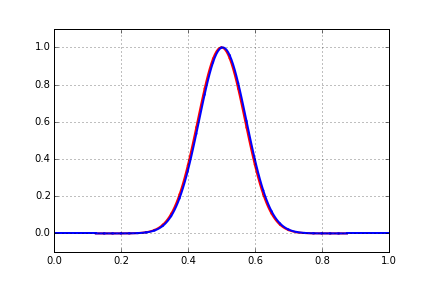
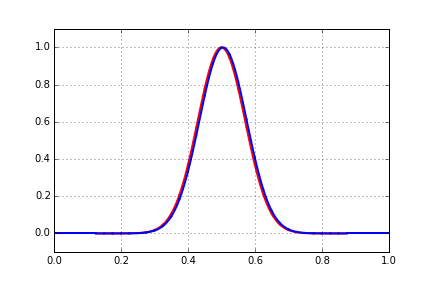
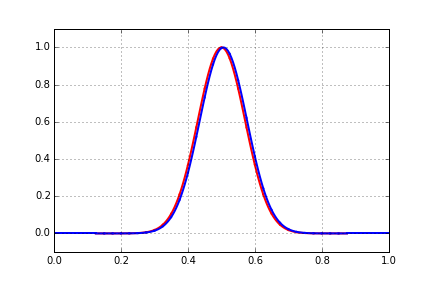
...
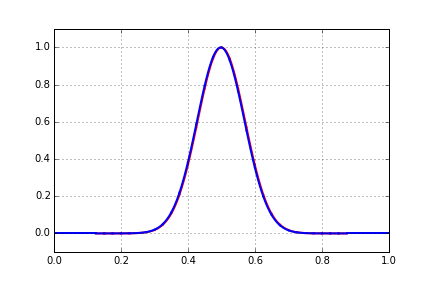
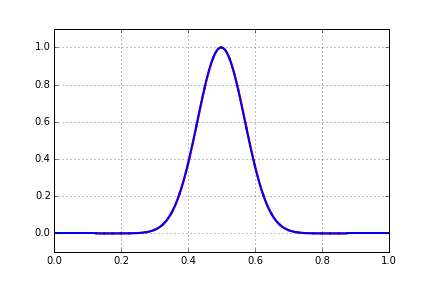
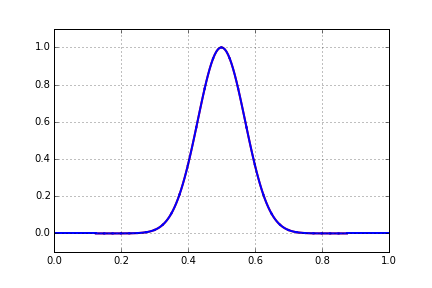
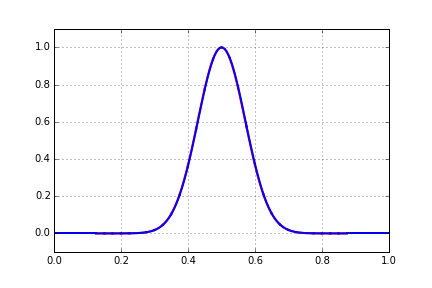
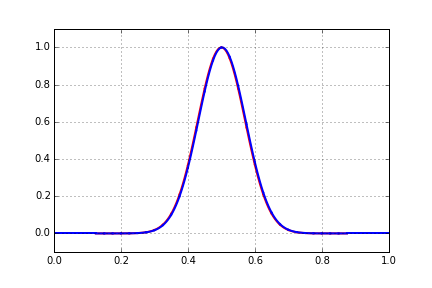

In [22]:
# dg1 is not the example code Prof. Per provided. its dg2 with animation feature
args, kwargs = dg1(n=40, porder=5, T=1.0, dt=1e-3)
animation.FuncAnimation(*args, **kwargs)

## b.

In [23]:
def dg2conv():
    n = np.array([5,10,20,40])
    h = np.array([1./5,1./10,1./20,1./40])
    p = np.array([1,2,3,4,5])
    e = np.zeros((5,4))
    slopes = np.zeros((5))
    T=1.0
    dt=1e-3
    for i in range(0,4):
        for j in range(0,5):
            u0, unew = dg2(n[i], p[j], T, dt)
            lu = unew.shape[0]
            error = np.zeros((lu))
            for k in range(0, lu):
                error[k] = max(abs(u0[k,:]-unew[k,:]))
            e[j,i] = max(error)
    
    slopes[0], intercept = np.polyfit(np.log(h[1:]),np.log(e[0,1:]),1)# taking last for points 
    for i in range(1,5):
        slopes[i], intercept = np.polyfit(np.log(h[:]),np.log(e[i,:]),1)    
    return e, slopes

In [24]:
e, slopes = dg2conv()
h = np.array([1./5,1./10,1./20,1./40])

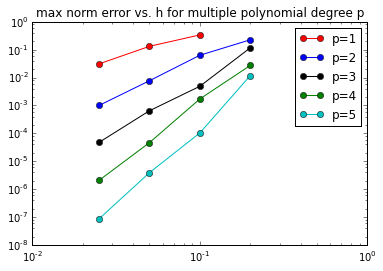

slopes
[ 1.72288391  2.64802508  3.6677679   4.62466118  5.58969748]


In [25]:
plt.title('max norm error vs. h for multiple polynomial degree p')
L1,=plt.loglog(h[1:],e[0,1:],'r',label='p=1',lw=1,marker='o')
L2,=plt.loglog(h,e[1,:],'b',label='p=2',lw=1,marker='o')
L3,=plt.loglog(h,e[2,:],'k',label='p=3',lw=1,marker='o')
L4,=plt.loglog(h,e[3,:],'g',label='p=4',lw=1,marker='o')
L5,=plt.loglog(h,e[4,:],'c',label='p=5',lw=1,marker='o')
Leg1=plt.legend(handles=[L1,L2,L3,L4,L5],loc=1)
plt.show()
print('slopes')
print(slopes)